In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.spatial.distance import cdist
import cv2
import sys
import pandas as pd
from IPython.display import display
from datetime import datetime
from astroquery.vizier import Vizier
from photutils.aperture import ApertureStats, aperture_photometry, CircularAperture, CircularAnnulus
from photutils.detection import DAOStarFinder, find_peaks
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.table import vstack, Table, Column
from astropy.wcs import WCS
import astropy.units as u
from astropy.coordinates import SkyCoord

sys.path.append('/home/finn/visual_Studio_Code/bachelorarbeit/')
from phot_used_functions import filter_sources, determine_distance, determine_shift, determine_shift_aa, determine_magnitudes, determine_fwhm
from phot_used_functions import import_images
from plotting import show_image

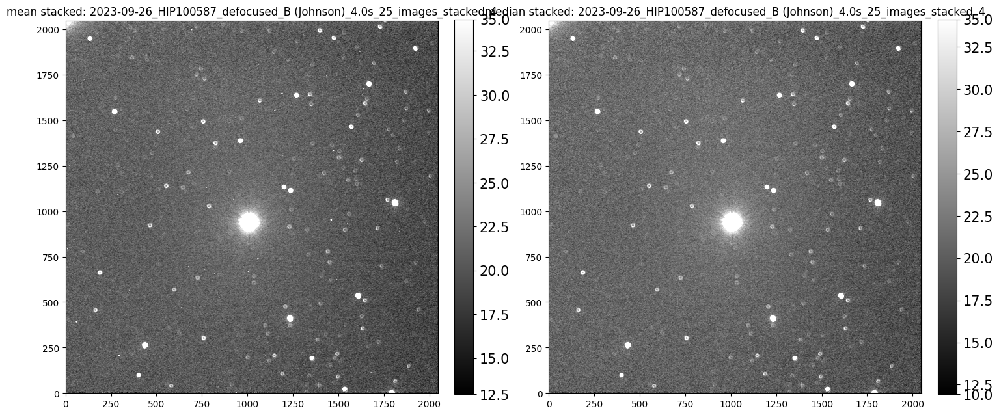

In [2]:
#path         ='/home/finn/visual_Studio_Code/data/2024-01-10/stacked/lightCor_HIP75458_df_B_3s_B (Johnson)_3.0s_50_images_stacked_0.fit'
#path_median  ='/home/finn/visual_Studio_Code/data/2024-01-10/stacked_median/lightCor_HIP75458_df_B_3s_B (Johnson)_3.0s_50_images_stacked_0.fit'

#path = '/home/finn/visual_Studio_Code/data/2024-01-11/stacked/lightCor_HIP75458_df_B_3_5s_B (Johnson)_3.5s_50_images_stacked_0.fit'
#path_median = '/home/finn/visual_Studio_Code/data/2024-01-11/stacked/lightCor_HIP75458_df_B_3_5s_B (Johnson)_3.5s_50_images_stacked_0.fit'

#path = '/home/finn/visual_Studio_Code/data/2023-09-11/stacked/lightCor_HIP100587_unfocused_B (Johnson)_4.0s_10_images_stacked_0.fit'
#path_median = '/home/finn/visual_Studio_Code/data/2023-09-11/stacked_old/lightCor_HIP100587_unfocused_B (Johnson)_4.0s__10_images_stacked_0.fit'

path = '/home/finn/visual_Studio_Code/data/2023-09-26/stacked/lightCor_HIP100587_defocused_B (Johnson)_4.0s_25_images_stacked_0.fit'
path_median = '/home/finn/visual_Studio_Code/data/2023-09-26/stacked_old/lightCor_HIP100587_defocused_B (Johnson)_4.0s_25_images_stacked_0.fit'

image_list,  header_list, titles, exptime = import_images(path)
image_list_median, header_list_median, titles_median, exptime_median = import_images(path_median)

middle = len(image_list)//2
middle_image = image_list_median[middle]

w = WCS(header_list[middle]) #use mean images wcs because i didnt solved for median yet


fig, ax = plt.subplots(1, 2, figsize=(15, 30))
show_image(image_list[middle], fig=fig, ax=ax[0])
show_image(middle_image , fig=fig, ax=ax[1])
ax[0].set_title(f'mean stacked: {titles[middle]}')
ax[1].set_title(f'median stacked: {titles_median[middle]}')
plt.tight_layout()

# 0. use normal image as reference picture

position of the bright star in focused image [[ 989.11598652 1017.30417089]]
detected stars in focused image: 150


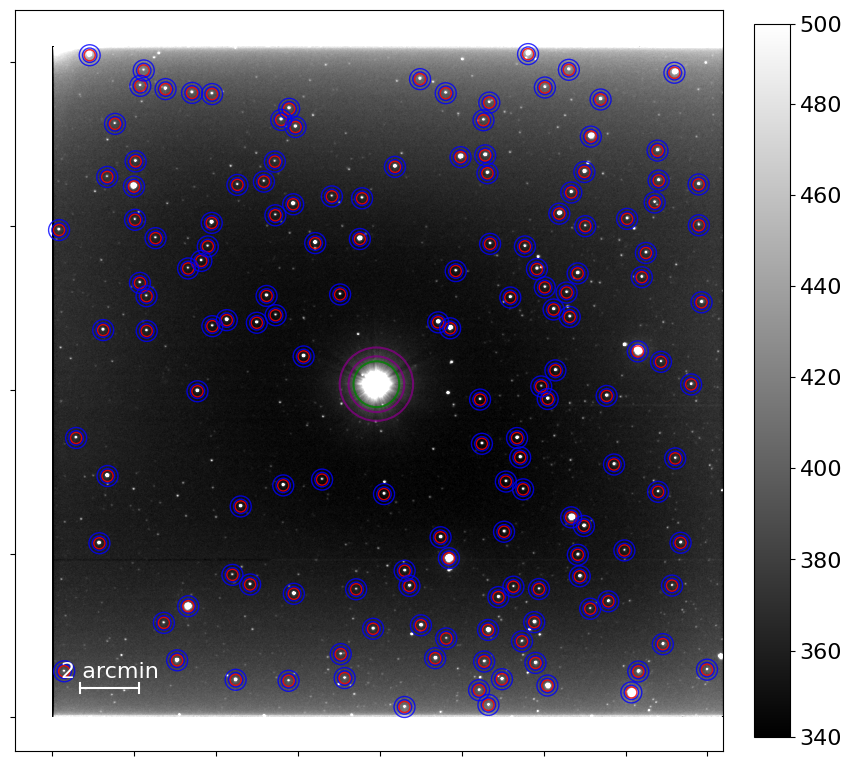

In [25]:
focused_path = "/home/finn/visual_Studio_Code/data/2023-09-25/stacked_old/lightCor_HIP100587_B (Johnson)_40.0s_long-short-series_10_images_stacked_0.fit"
#focused_path = '/home/finn/visual_Studio_Code/data/2023-09-11/stacked/lightCor_HIP100587_focused_B (Johnson)_40.0s_10_images_stacked_1.fit'
#focused_path = "/content/drive/MyDrive/Bachelor/data/2023-08-23/lightCor/lightCor_R (Johnson)_30.0_0.fit"
#focused_path = "/home/finn/visual_Studio_Code/data/2023-09-11/stacked/lightCor_HIP100587_focused_B (Johnson)_2.0s_10_images_stacked_2.fit"
#focused_path = '/content/drive/MyDrive/Bachelor/data/2023-09-11/lightCor/lightCor_HIP100587_focused_R (Johnson)_1.0s_17.fit'
#focused_path = '/content/drive/MyDrive/Bachelor/data/2023-09-05/stacked/lightCor_HIP75458_H-alpha_40.0s_long_short_10_images_stacked_4.fit'
#focused_path = "/content/drive/MyDrive/Bachelor/data/2023-09-11/stacked/lightCor_HIP100587_focused_B (Johnson)_2.0s_long_short_10_images_stacked_2.fit"
#focused_path = "/content/drive/MyDrive/Bachelor/data/2023-09-11/stacked/lightCor_HIP100587_focused_B (Johnson)_40.0s_long_short_10_images_stacked_0.fit"
r_br = 250   # change here (choose larger: is only estimate)!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
center = [1100,1100]  # change here !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

hdul2 = fits.open(focused_path)
focused_image = hdul2[0].data
fig, ax = plt.subplots(1,1, figsize = (10,10))
show_image(focused_image, fig=fig, ax=ax, show_ticks=False, fs_colorbar=16, scale=True)
#show_image(focused_image, fig=fig, ax=ax, show_ticks=False)
#ax.set_title(f" {hdul2[0].header['DATE-OBS'][:10]}_{hdul2[0].header['OBJECT']}")
#ax.tick_params(left= False, bottom=False)

# for bright star
mask = np.zeros(image_list[0].shape, dtype=bool)
x, y = np.ogrid[:focused_image.shape[1], :image_list[0].shape[0]]
circle_mask = np.sqrt((x - center[0]) ** 2 + (y - center[1]) ** 2) <= r_br
mask[circle_mask] = True
mask = ~mask

mean, median, std = sigma_clipped_stats(focused_image, sigma=3.0)
daofind_bright = DAOStarFinder(fwhm=10.0, threshold=5.0*std, roundlo=-5.0, roundhi=5.0, brightest=1) #roundlo and roundhi to adjust detection shape. need to be calibrated
sources_bright = daofind_bright(focused_image, mask = mask) #### or image-median? ???????????????????????????
sources_bright.sort(['xcentroid', 'ycentroid'])
position_bright_focused = np.transpose((sources_bright['xcentroid'], sources_bright['ycentroid']))
aperture_bright = CircularAperture(position_bright_focused, r=70)
annulus_bright = CircularAnnulus(position_bright_focused, r_in=85,  r_out=112)
aperture_bright.plot(color='green', lw=1.5, alpha=0.8);
annulus_bright.plot(color='purple', lw=1.5, alpha=0.8);
print("position of the bright star in focused image",position_bright_focused)

# for faint star
mask2 = np.zeros(focused_image.shape, dtype=bool)
circle_mask2 = np.sqrt((x - position_bright_focused[0][0]) ** 2 + (y - position_bright_focused[0][1]) ** 2) <= r_br
mask2[circle_mask2] = True
daofind_faint = DAOStarFinder(fwhm=3.0, threshold=6.0*std, roundlo=-5.0, roundhi=5.0) #no need to adjust parameters, will do that later
sources_faint = daofind_faint(focused_image, mask=mask2)
sources_faint.sort(['xcentroid', 'ycentroid'])
positions_faint = np.transpose((sources_faint['xcentroid'], sources_faint['ycentroid']))
positions_faint,sources_faint = filter_sources(positions_faint, sources_faint, min_separation=40,  min_edge_distance=20) #exclude multiple detections of star
print('detected stars in focused image:', len(positions_faint))
radius_faint = 17 #not relevant for later
apertures_faint = [CircularAperture(position, r=radius_faint) for position in positions_faint]
annulus_apertures_faint = [CircularAnnulus(position,r_in=radius_faint+5, r_out=radius_faint+15) for position in positions_faint]
for aperture in apertures_faint:
    aperture.plot(color="red", lw=1.0, alpha=0.8)
for anulus in annulus_apertures_faint:
    anulus.plot(color="blue", lw=1.0, alpha=0.8)

# 1. For bright Star (method: detect star on every image using starfinder)


In [7]:
shifts = determine_shift(image_list, focused_image)
print(shifts)

Number of images to process: 8


[(5.6658616, -77.596634), (7.204078, -78.074844), (11.154691, -78.50364), (13.271514, -78.54381), (16.705992, -78.511734), (21.221148, -78.72885), (34.409744, -78.39774), (42.517445, -78.86473)]


In [9]:
extra_shift=[4,-2]
shifts = [(s[0]+extra_shift[0], s[1]+extra_shift[1]) for s in shifts]
print(shifts)

[(9.6658616065979, -79.59663391113281), (11.204078197479248, -80.07484436035156), (15.154690742492676, -80.5036392211914), (17.27151393890381, -80.54380798339844), (20.705991744995117, -80.51173400878906), (25.221147537231445, -80.72885131835938), (38.40974426269531, -80.39774322509766), (46.5174446105957, -80.86473083496094)]


[-15.476123546868457, -15.474032888729162, -15.474719102953664, -15.474155928364466, -15.473228561483872, -15.473807766366978, -15.476271820516816, -15.47623902041205]
0.0011428364795643107
[-15.467801776424556, -15.46881062773955, -15.465254569622793, -15.468518402932771, -15.469166820474037, -15.4672401871777, -15.467856605778172, -15.46733045492845]
0.0011401670519025511


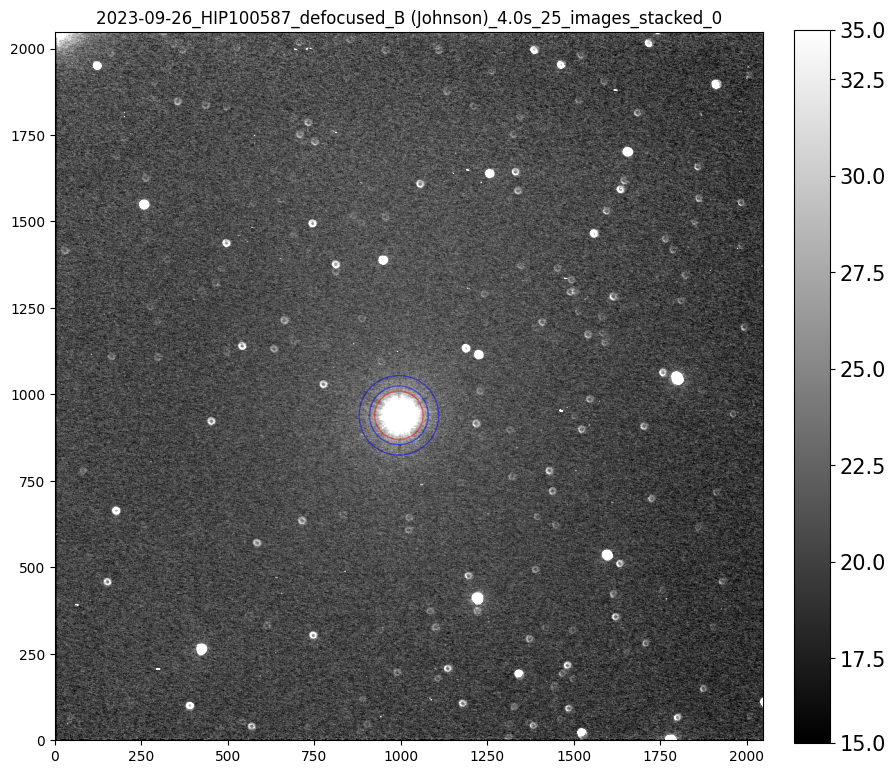

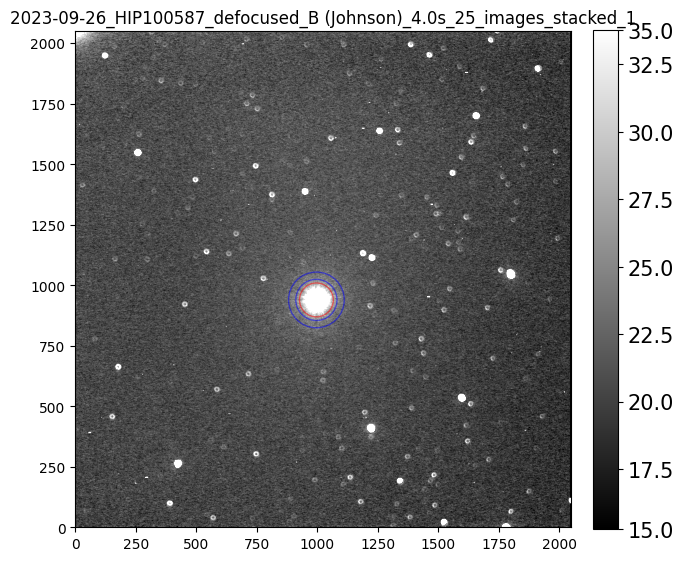

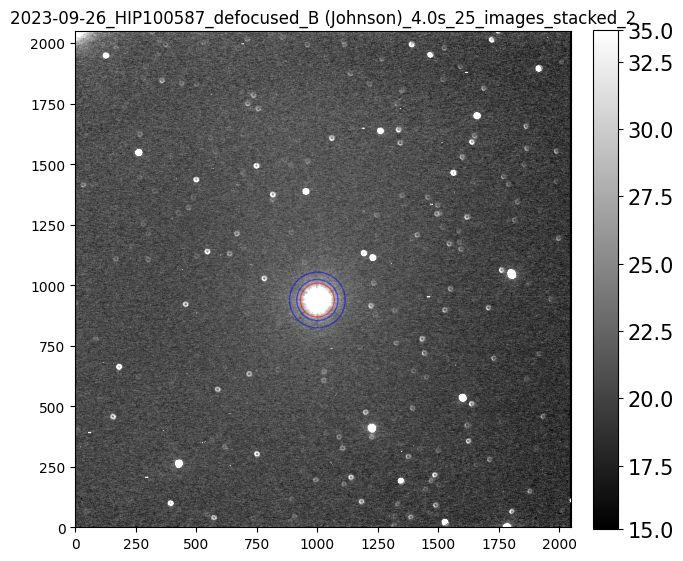

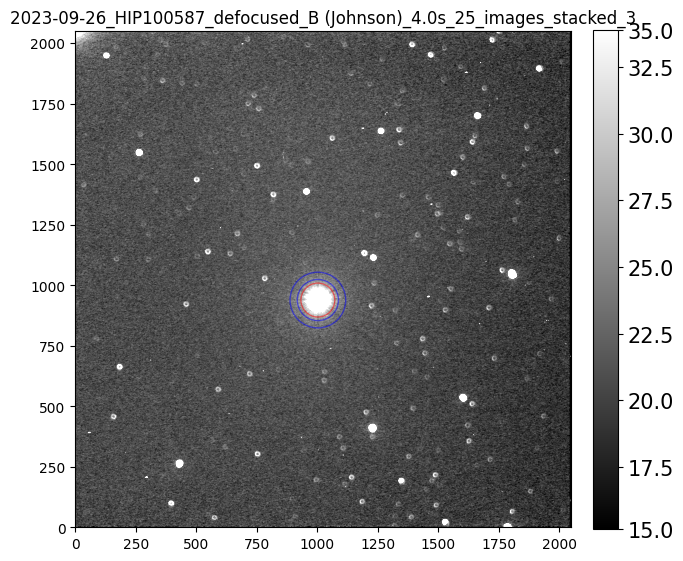

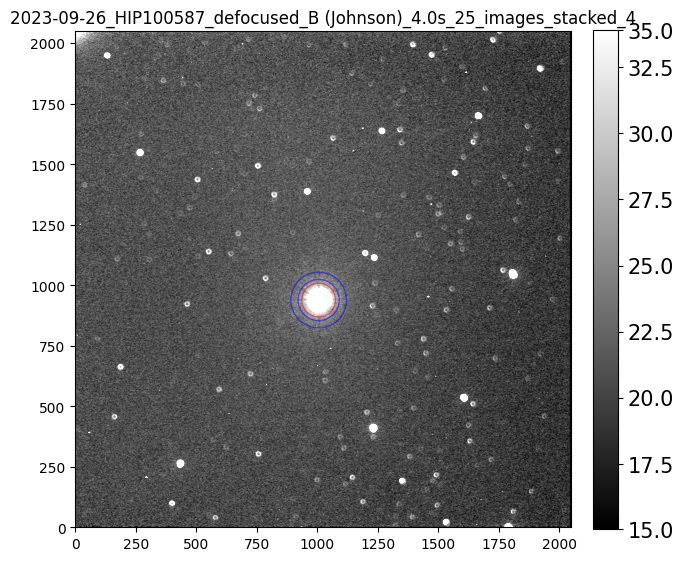

...

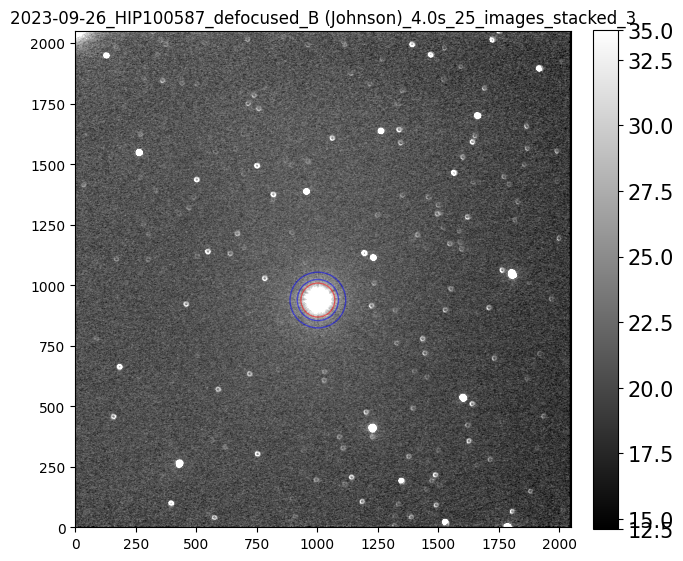

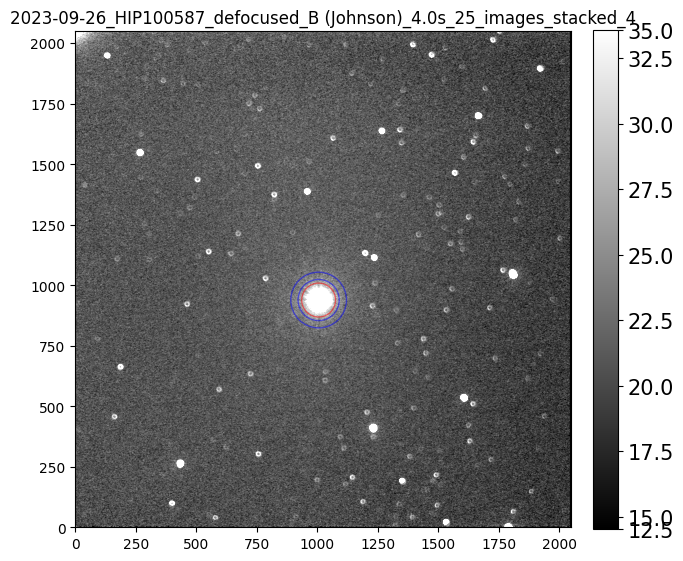

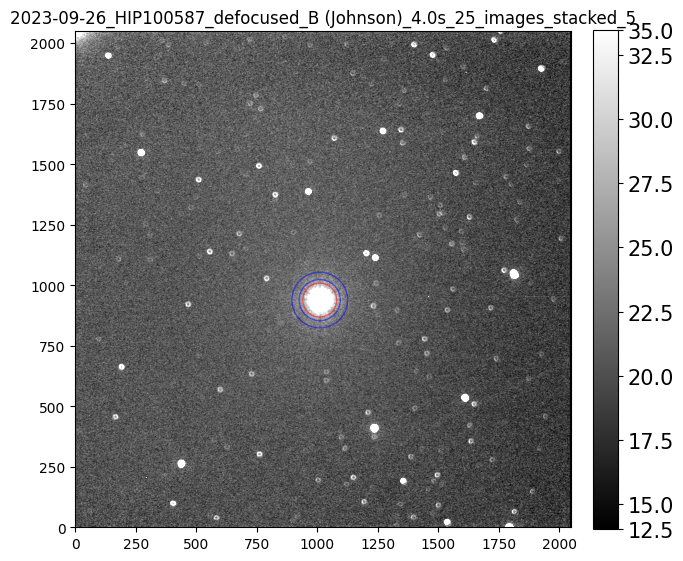

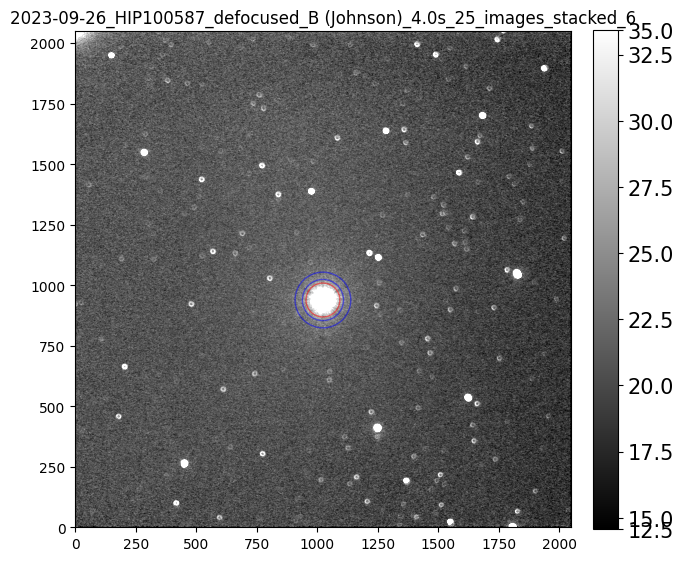

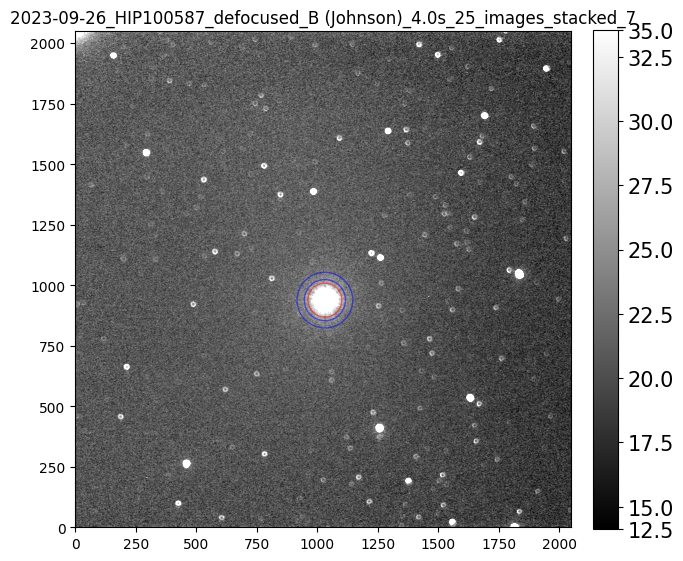

In [10]:
r_br = 70 ############## change here 
def get_mag_bright(image_list, apperture_radius=60): #default value of the apperture radius is 60 but need to be changed below
    positions_bright, magnitude_list_bright = [], []
    mean, median, std = sigma_clipped_stats(focused_image, sigma=3.0)
    daofind = DAOStarFinder(fwhm=5.0, threshold=5.0*std, roundlo=-5.0, roundhi=5.0,brightest=1) #roundlo and roundhi to adjust detection shape. need to be
    sources = daofind(focused_image, mask=mask)
    positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
    #positions = [(1032, 880)]# if pos from clicker. if pos from ref image change here !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

    for i, image in enumerate(image_list):
        shifted_position = [[positions[0][0]+shifts[i][0], positions[0][1]+shifts[i][1]]]   #the two [] just to match function     
        if i == 0:
            fig, ax = plt.subplots(1,1, figsize=(10,10))
        else: 
            fig, ax = plt.subplots(1,1, figsize=(7,7))
        show_image(image, fig=fig, ax=ax)
        ax.set_title(titles[i])
        magnitudes = determine_magnitudes(image, positions=shifted_position, star_radius=apperture_radius, exptime=exptime)
        magnitude_list_bright.append(magnitudes)
        positions_bright.append(shifted_position)
    print(magnitude_list_bright)
    print(np.std(magnitude_list_bright))
    #print(positions_bright)
    return positions_bright, magnitude_list_bright

pos_br_mean, mag_br_mean = get_mag_bright(image_list, apperture_radius=r_br)
pos_br_median, mag_br_median = get_mag_bright(image_list_median, apperture_radius=r_br)

# 2. Background stars

In [20]:
#alternative way of determine shifts using dist. from bright stars of images
'''shifts_ft = []
for position in pos_br_median:
    shift = (position[0][0]-position_bright_focused[0][0], position[0][1]-position_bright_focused[0][1])
    shifts_ft.append(shift)

print(shifts_ft)'''

'shifts_ft = []\nfor position in pos_br_median:\n    shift = (position[0][0]-position_bright_focused[0][0], position[0][1]-position_bright_focused[0][1])\n    shifts_ft.append(shift)\n\nprint(shifts_ft)'

In [16]:
extra_shift=[0,1]
shifts = [(s[0]+extra_shift[0], s[1]+extra_shift[1]) for s in shifts]
print(shifts)

[(9.6658616065979, -76.59663391113281), (11.204078197479248, -77.07484436035156), (15.154690742492676, -77.5036392211914), (17.27151393890381, -77.54380798339844), (20.705991744995117, -77.51173400878906), (25.221147537231445, -77.72885131835938), (38.40974426269531, -77.39774322509766), (46.5174446105957, -77.86473083496094)]


detected stars in focused image: 150
139
[-7.542501894232776, -7.518041356516468, -7.499807468037881, -7.513583586986847, -7.4908752784013135, -7.475689510036858, -7.504930347335862, -7.478376945696522]
0.02065107358551399
[-7.544096541090722, -7.507198195578778, -7.494337011017663, -7.5019128863426605, -7.501469234248122, -7.48565751030043, -7.503476542410598, -7.4882573784542785]
0.016965898599289413


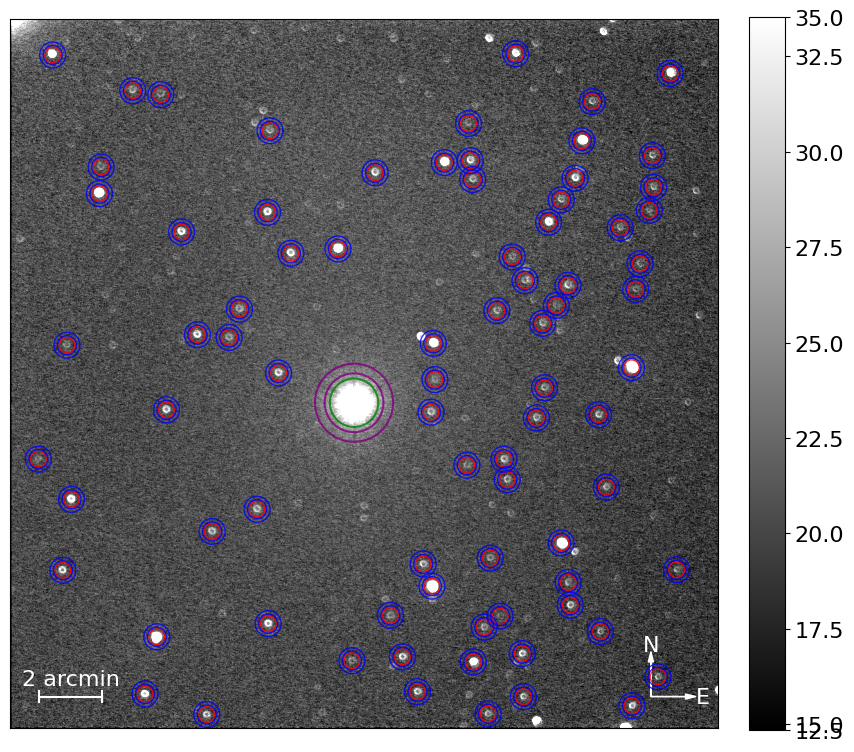

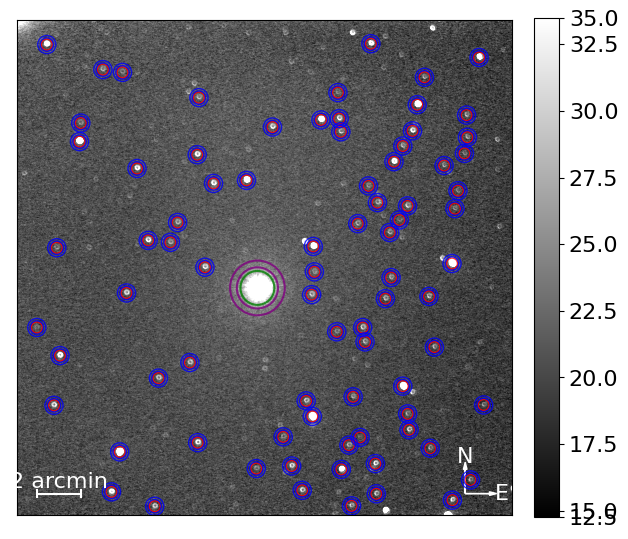

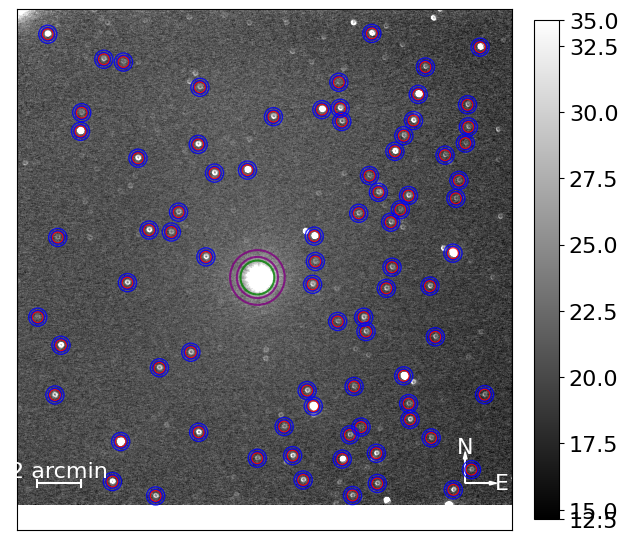

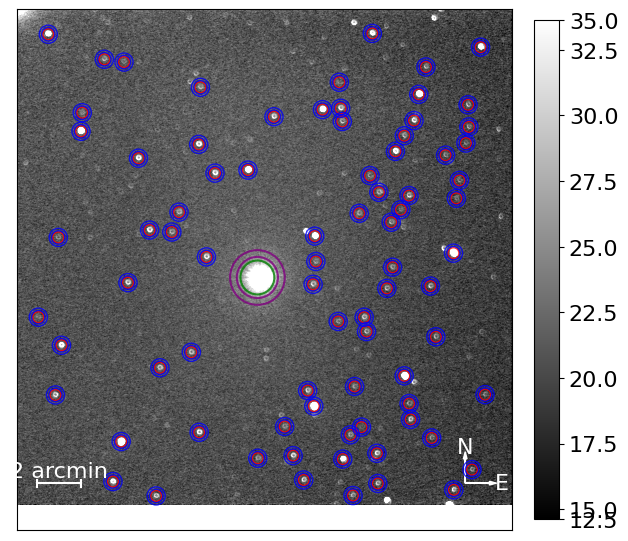

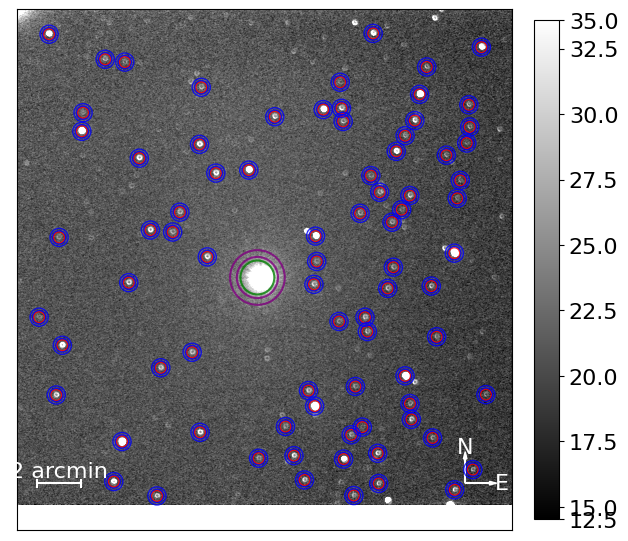

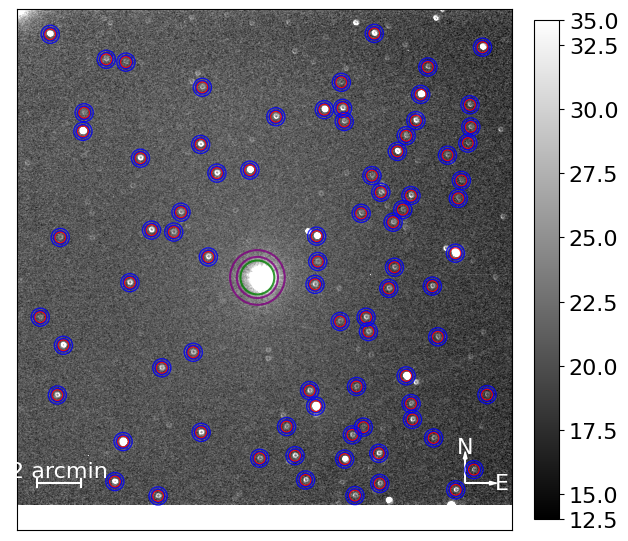

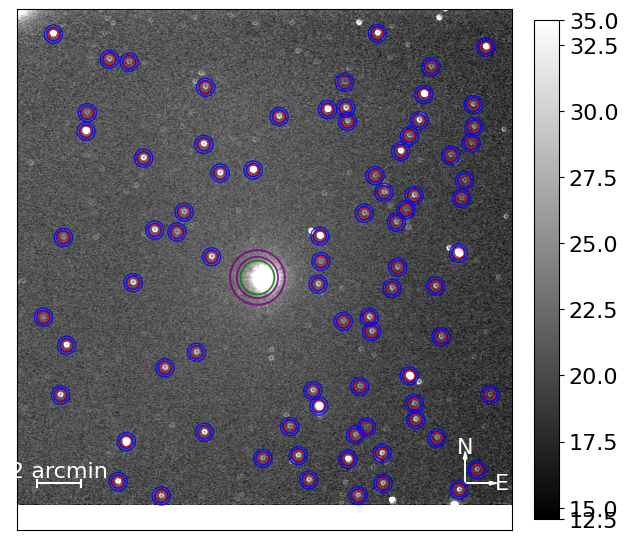

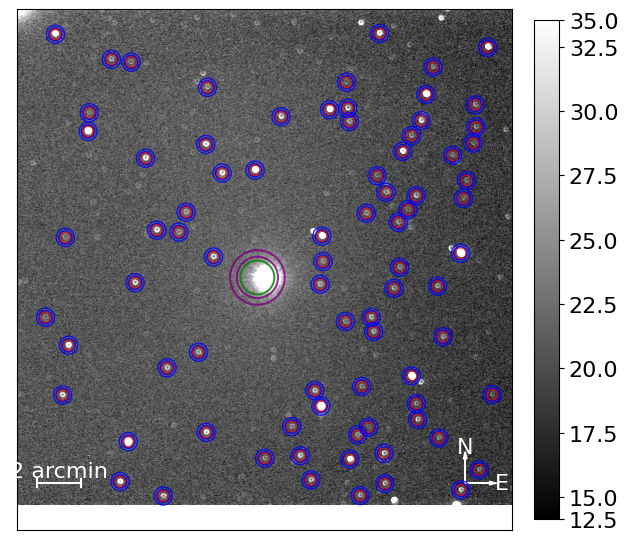

In [18]:
r_ft= 22.5    #change here
top_n=80 #change number of stars here (count from brightest)



#detect positions in reference (focused image) and later shift the positions to the df images, the other method is to use clicker.py to determine positions by hand
mask2 = np.zeros(focused_image.shape, dtype=bool)
x, y = np.ogrid[:focused_image.shape[1], :focused_image[0].shape[0]]
circle_mask = np.sqrt((x - position_bright_focused[0][0]) ** 2 + (y - position_bright_focused[0][1]) ** 2) <= (r_br+30)
mask2[circle_mask] = True

daofind_faint = DAOStarFinder(fwhm=2.0, threshold=5.0*std, roundlo=-5.0, roundhi=5.0) ### change brightest for every series !!!!!!!!!!!!!!!!!
sources_faint = daofind_faint(focused_image, mask=mask2)
sources_faint.sort(['xcentroid', 'ycentroid'])
positions_faint = np.transpose((sources_faint['xcentroid'], sources_faint['ycentroid']))
positions_faint,sources_faint = filter_sources(positions_faint, sources_faint, min_separation=50, min_edge_distance=10) #exclude multiple detections of star, min edge dist not relevant since we will shift pos
print('detected stars in focused image:', len(positions_faint))

#or use positions from clicker
#positions_faint = [(411, 431), (400, 552), (1105, 690), (897, 1707), (1305, 1301), (1718, 1694)]
#print(len(positions_faint))

edge = 30
valid_positions = [pos for pos in positions_faint if all(edge < pos[0] + shift[0] < 2048 - edge and edge < pos[1] + shift[1] < 2048 - edge for shift in shifts)]
print(len(valid_positions))

def get_mag_faint(input_list, plotting = False):
    magnitude_list_faint, positions_faint = [],[]

    for i,image in enumerate (input_list):
        
        shifted_positions = []
        if i == 0: # for the first image use the pre determined pos
            for position in valid_positions:
                tuple = np.array((position[0]+shifts[i][0], position[1]+shifts[i][1]))
                shifted_positions.append(tuple)
        else:
            for position in positions_faint[0]: # because we choose top_n in first image we need to stick to these positons, otherwise we would determine top_n new in everimage -> usage of different ref stars
                tuple = np.array((position[0]+shifts[i][0]-shifts[0][0], position[1]+shifts[i][1]-shifts[0][1])) # -shifts[0] because positions_faint already shifted
                #tuple = np.array((position[0], position[1]))
                shifted_positions.append(tuple)


        apertures_faint = [CircularAperture(position, r=r_ft) for position in shifted_positions]
        annulus_apertures_faint = [CircularAnnulus(position,r_in=r_ft+5, r_out=r_ft+15) for position in shifted_positions]
        
        # Initialize an empty table to store the photometry results
        phot_table_faint = Table(names=('id', 'xcenter', 'ycenter', 'aperture_sum', 'total_bkg'), dtype=('int', 'float', 'float', 'float', 'float'))
        for j in range(len(apertures_faint)):
            aperstats = ApertureStats(image, annulus_apertures_faint[j])
            bkg = aperstats.median
            aperture_area = apertures_faint[j].area_overlap(image)
            total_bkg = bkg * aperture_area
            phot_table = aperture_photometry(image, apertures_faint[j])
            phot_table['total_bkg'] = total_bkg
            phot_table_faint.add_row([j, phot_table['xcenter'][0], phot_table['ycenter'][0], phot_table['aperture_sum'][0], phot_table['total_bkg'][0]])
        #phot_table_faint.pprint(max_lines = -1, max_width = -1)

        magnitudes=[]
        for row in phot_table_faint:
            magnitude =  - (2.5 * np.log10(abs(row['aperture_sum'] - row['total_bkg']) / exptime))
            magnitudes.append(magnitude)
        

        sorted_indices = np.argsort(magnitudes)[:top_n]
        top_n_magnitudes = [magnitudes[idx] for idx in sorted_indices]
        top_n_positions = [shifted_positions[idx] for idx in sorted_indices]
        apertures_faint = [apertures_faint[idx] for idx in sorted_indices]
        annulus_apertures_faint = [annulus_apertures_faint[idx] for idx in sorted_indices]
        
        magnitude_list_faint.append(top_n_magnitudes)
        positions_faint.append(top_n_positions)

        if plotting == True:
            if i == 0:
                fig, ax = plt.subplots(1, 1, figsize=(10, 10))
            else:
                fig, ax = plt.subplots(1,1, figsize=(7,7))
            show_image(image, fig=fig, ax=ax, show_ticks=False, fs_colorbar=16, cmap='gray', arrow_color='white', scale=True, north_arrow=True, east_arrow=True )
            #ax.set_title(titles[i])
            ax.tick_params(left=False, bottom=False)
            for aperture in apertures_faint:
                aperture.plot(color="red", lw=1.0, alpha=0.8)
            for anulus in annulus_apertures_faint:
                anulus.plot(color="blue", lw=1.0, alpha=0.8)


    mean_faint_magnitudes_list = [np.mean(mag) for mag in magnitude_list_faint] #mean of all refernce stars
    print(mean_faint_magnitudes_list)
    print(np.std(mean_faint_magnitudes_list))
    return positions_faint, magnitude_list_faint, mean_faint_magnitudes_list


pos_ft_mean,    mag_ft_mean,    mean_mag_ft_mean    = get_mag_faint(image_list, plotting = False)
pos_ft_median,  mag_ft_median,  mean_mag_ft_median  = get_mag_faint(image_list_median, plotting=True)

# Diff Phot


In [26]:
def print_results(magnitude_list_bright,mean_faint_magnitudes_list):
  diff_magnitude_list = []
  #print("index  bright mag        faint mag         diff mag")
  for index in range (len(magnitude_list_bright)):
    diff_magnitude= magnitude_list_bright[index] - mean_faint_magnitudes_list [index]
    #print(index,  magnitude_list_bright[index] , mean_faint_magnitudes_list [index], diff_magnitude)
    diff_magnitude_list.append(diff_magnitude)
  #print(f"The differential Magnitude is: M = ${round(np.mean(diff_magnitude_list), 4)}\pm{round(np.std(diff_magnitude_list), 4)}$ mag")
  #print(f"Value for bright star: {round(np.mean(magnitude_list_bright),4)}+-{round(np.std(magnitude_list_bright),4)}")
  #print(f"Value for faint stars: {round(np.mean(mean_faint_magnitudes_list),4)}+-{round(np.std(mean_faint_magnitudes_list),4)}")
  print(round(np.std(diff_magnitude_list),4))
  return(np.std(diff_magnitude_list))
  
print('for mean:')
print_results(mag_br_mean,  mean_mag_ft_mean)
print('')
print('for median:')
print_results(mag_br_median,  mean_mag_ft_median)
print(f'r_br={r_br} r_ft={r_ft}, extra_shift={extra_shift}')


for mean:
0.0146

for median:
0.0146
r_br=105 r_ft=22.5, extra_shift=[0, 0]


In [85]:
# for bright position 
bright_results = []
empty_column = Column(name='Position Number', data=[None])
x_column = Column(name='x', data=[None])
y_column = Column(name='y', data=[None])

sky = w.pixel_to_world(*pos_br_mean[middle][0]) # for only one image 
print(sky)
star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))

viz = Vizier(columns=['DR3Name', 'RAJ2000', 'DEJ2000', 'BPmag','e_BPmag', 'RPmag', 'e_RPmag', 'Gmag', 'Plx','e_Plx', 'G-RP', 'BP-RP']) # params for gaia: Gmag: phot_g_mean_mag, Plx: parallax [mas], G-RP: Gmag-Rmag
result = viz.query_region(star_coords, radius=10 * u.arcsecond, catalog='I/355 ') #gaia dr3

# Check and select the entry with the lowest magnitude
if result is not None and len(result) > 0:
    min_mag_idx = None
    min_mag = float('inf')

    # Find the entry with the lowest magnitude
    for idx, row in enumerate(result[0]):
        if row['BPmag'] < min_mag:
            min_mag = row['BPmag']
            min_mag_idx = idx
        if row['RPmag'] < min_mag:
            min_mag = row['RPmag']
            min_mag_idx = idx

    # If a minimum magnitude entry is found, update the values
    if min_mag_idx is not None:
        # Use .copy() to avoid modifying the original columns
        result[0]['Position Number'] = empty_column.copy()
        result[0]['x'] = x_column.copy()
        result[0]['y'] = y_column.copy()
        # Update the values for the current iteration
        result[0]['Position Number'][min_mag_idx] = len(pos_ft_mean[0])+1 #give it the last number, because we will combine with faint list
        result[0]['x'][min_mag_idx] = pos_br_mean[middle][0][0]
        result[0]['y'][min_mag_idx] = pos_br_mean[middle][0][1]

        bright_results.append(result[0][min_mag_idx])

print(bright_results)

[<Quantity 1033.>, <Quantity 881.>]


AttributeError: 'list' object has no attribute 'ra'

In [49]:
# for faint position 
all_results = []
empty_column = Column(name='Position Number', data=[None])
x_column = Column(name='x', data=[None])
y_column = Column(name='y', data=[None])

for i, position in enumerate(pos_ft_mean[middle]):
    sky = w.pixel_to_world(*position)
    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))

    viz = Vizier(columns=['DR3Name', 'RAJ2000', 'DEJ2000', 'BPmag','e_BPmag', 'RPmag', 'e_RPmag', 'Gmag', 'Plx','e_Plx', 'G-RP', 'BP-RP']) # params for gaia
    result = viz.query_region(star_coords, radius= 10.0 * u.arcsecond, catalog='I/355 ') #gaia dr3

    # Check and select the entry with the lowest magnitude
    if result is not None and len(result) > 0:
        min_mag_idx = None
        min_mag = float('inf')

        # Find the entry with the lowest magnitude
        for idx, row in enumerate(result[0]):
            if row['BPmag'] < min_mag:
                min_mag = row['BPmag']
                min_mag_idx = idx
            if row['RPmag'] < min_mag:
                min_mag = row['RPmag']
                min_mag_idx = idx

        # If a minimum magnitude entry is found, update the values
        if min_mag_idx is not None:
            # Use .copy() to avoid modifying the original columns
            result[0]['Position Number'] = empty_column.copy()
            result[0]['x'] = x_column.copy()
            result[0]['y'] = y_column.copy()
            # Update the values for the current iteration
            result[0]['Position Number'][min_mag_idx] = i + 1
            result[0]['x'][min_mag_idx] = position[0]
            result[0]['y'][min_mag_idx] = position[1]

            all_results.append(result[0][min_mag_idx])

print(len(all_results))

5


In [50]:
final_table_gaia = vstack(all_results + bright_results)
df = final_table_gaia.to_pandas()
display(df)

,DR3Name,RAJ2000,DEJ2000,BPmag,e_BPmag,RPmag,e_RPmag,Gmag,Plx,e_Plx,G-RP,BP-RP,Position Number,x,y
0,Gaia DR3 1614729689788210816,231.017481,58.852981,9.204021,0.002816,8.006947,0.003793,8.684293,2.3169,0.0141,0.677346,1.197074,1,413.0,210.0
1,Gaia DR3 1615104863770812928,231.336459,59.011815,8.943880,0.003098,7.096273,0.003879,8.036714,1.2638,0.0179,0.940441,1.847607,2,1306.0,1079.0
2,Gaia DR3 1614733916036019584,231.191145,59.086805,10.615170,0.002815,9.410266,0.003785,10.092779,1.1997,0.0138,0.682513,1.204904,3,897.0,1485.0
3,Gaia DR3 1614729895945409920,231.012579,58.874663,11.538903,0.002837,10.294217,0.003792,10.989657,0.8513,0.0107,0.695440,1.244686,4,400.0,328.0
4,Gaia DR3 1614727868722098432,231.263901,58.900306,12.298968,0.002819,11.482958,0.003792,11.973337,2.5315,0.0117,0.490379,0.816010,5,1104.0,470.0
5,Gaia DR3 1614731957531452544,231.232391,58.966066,3.760666,0.018295,2.408632,0.012809,2.972920,32.5239,0.1310,0.564288,1.352034,6,1014,827


In [86]:
#combine the faint and bright magnitudes (for saving them into table later)
mag_all_mean    = [ft + [br] for ft, br in zip(mag_ft_mean, mag_br_mean)]
mag_all_median  = [ft + [br] for ft, br in zip(mag_ft_median, mag_br_median)]

print(mag_all_mean[0][-1])
print(len(mag_all_mean[0]))

-16.61343121196558
6


In [52]:
#only save the magnitudes from the positions which are solved with gaia data
valid_positions = df['Position Number'].to_list()
print('valid positions: ',valid_positions)

valid_mag_mean   = []
valid_mag_median = []
for i in range (len(mag_all_mean)):
    m1=[]
    m2=[]
    for index in valid_positions:
        m1.append(mag_all_mean[i][index-1])
        m2.append(mag_all_median[i][index-1])
    valid_mag_mean.append(m1)
    valid_mag_median.append(m2)

print(valid_positions)
print(mag_all_median)
print(valid_mag_median)

for i, mag_list in enumerate(valid_mag_mean):
    col_name = f'Mag_Mean_Im_{i+1}'  # create coloumn for each image
    df = df.assign(**{col_name: mag_list})  # Add magnitudes for the current image to the DataFrame

for i, mag_list in enumerate(valid_mag_median):
    col_name = f'Mag_Median_Im_{i+1}'  # create coloumn for each image
    df = df.assign(**{col_name: mag_list}) 

display(df)

valid positions:  [1, 2, 3, 4, 5, 6]
[1, 2, 3, 4, 5, 6]
[[-11.162951121212057, -10.776549767139459, -9.603781916360548, -8.745318650648173, -8.208926225131465, -16.64838338384159], [-11.165620552142624, -10.783470808154455, -9.590293569070523, -8.780461659449472, -8.168390792840833, -16.652755738025032], [-11.164748942940989, -10.780469353036505, -9.607357870320362, -8.76647043017605, -8.226763169179979, -16.656722429771342], [-11.168167197168646, -10.780781532145216, -9.614368254268753, -8.78677369460213, -8.235448350526056, -16.659608906814135], [-11.170178103962336, -10.78561149582203, -9.607776394029967, -8.799972030894194, -8.290543938260042, -16.661316392123776], [-11.172411331991894, -10.788893258370134, -9.60344843485157, -8.725012266952973, -8.234377192070635, -16.662908673838782], [-11.185383602750827, -10.803087188893148, -9.615148890790877, -8.725931184505786, -8.231018025441216, -16.676281577122634], [-11.183739604492883, -10.812170328408971, -9.584754840939297, -8.7450014

,DR3Name,RAJ2000,DEJ2000,BPmag,e_BPmag,RPmag,e_RPmag,Gmag,Plx,e_Plx,...,Mag_Mean_Im_9,Mag_Median_Im_1,Mag_Median_Im_2,Mag_Median_Im_3,Mag_Median_Im_4,Mag_Median_Im_5,Mag_Median_Im_6,Mag_Median_Im_7,Mag_Median_Im_8,Mag_Median_Im_9
0,Gaia DR3 1614729689788210816,231.017481,58.852981,9.204021,0.002816,8.006947,0.003793,8.684293,2.3169,0.0141,...,-11.190344,-11.162951,-11.165621,-11.164749,-11.168167,-11.170178,-11.172411,-11.185384,-11.183740,-11.189600
1,Gaia DR3 1615104863770812928,231.336459,59.011815,8.943880,0.003098,7.096273,0.003879,8.036714,1.2638,0.0179,...,-10.816561,-10.776550,-10.783471,-10.780469,-10.780782,-10.785611,-10.788893,-10.803087,-10.812170,-10.816774
2,Gaia DR3 1614733916036019584,231.191145,59.086805,10.615170,0.002815,9.410266,0.003785,10.092779,1.1997,0.0138,...,-9.582390,-9.603782,-9.590294,-9.607358,-9.614368,-9.607776,-9.603448,-9.615149,-9.584755,-9.579408
3,Gaia DR3 1614729895945409920,231.012579,58.874663,11.538903,0.002837,10.294217,0.003792,10.989657,0.8513,0.0107,...,-8.818845,-8.745319,-8.780462,-8.766470,-8.786774,-8.799972,-8.725012,-8.725931,-8.745001,-8.813944
4,Gaia DR3 1614727868722098432,231.263901,58.900306,12.298968,0.002819,11.482958,0.003792,11.973337,2.5315,0.0117,...,-8.210580,-8.208926,-8.168391,-8.226763,-8.235448,-8.290544,-8.234377,-8.231018,-8.255240,-8.214181
5,Gaia DR3 1614731957531452544,231.232391,58.966066,3.760666,0.018295,2.408632,0.012809,2.972920,32.5239,0.1310,...,-16.691762,-16.648383,-16.652756,-16.656722,-16.659609,-16.661316,-16.662909,-16.676282,-16.685378,-16.686420


In [87]:
# save only mags and x,y if cant be solved with gaia data
'''df = pd.DataFrame({
    f'Mag_Mean_Im_{i+1}': mag_list_mean for i, mag_list_mean in enumerate(mag_all_mean)
})

# Adding columns from mag_all_median to the DataFrame
df = pd.concat([
    df,
    pd.DataFrame({
        f'Mag_Median_Im_{i+1}': mag_list_median for i, mag_list_median in enumerate(mag_all_median)
    })
], axis=1)

all_pos = pos_ft_median[middle] + pos_br_median[middle]
print(all_pos)
x_values = [pos[0] for pos in all_pos]
y_values = [pos[1] for pos in all_pos]
df['x'] = x_values
df['y'] = y_values

# Display the created DataFrame
display(df)'''

[array([428.7, 262.5]), array([1322.5, 1132. ]), array([ 913.2, 1536.9]), array([415.9, 380.8]), array([1120.5,  522.2]), [1032, 880]]


,Mag_Mean_Im_1,Mag_Mean_Im_2,Mag_Mean_Im_3,Mag_Mean_Im_4,Mag_Mean_Im_5,Mag_Mean_Im_6,Mag_Mean_Im_7,Mag_Mean_Im_8,Mag_Mean_Im_9,Mag_Mean_Im_10,...,Mag_Median_Im_4,Mag_Median_Im_5,Mag_Median_Im_6,Mag_Median_Im_7,Mag_Median_Im_8,Mag_Median_Im_9,Mag_Median_Im_10,Mag_Median_Im_11,x,y
0,-11.124002,-11.122782,-11.136069,-11.140610,-11.144563,-11.142282,-11.140184,-11.154732,-11.160209,-11.149846,...,-11.140610,-11.144563,-11.142282,-11.140184,-11.154732,-11.160209,-11.149846,-11.166695,428.7,262.5
1,-10.772596,-10.773171,-10.773961,-10.784061,-10.783592,-10.790837,-10.799016,-10.807461,-10.806510,-10.783523,...,-10.784061,-10.783592,-10.790837,-10.799016,-10.807461,-10.806510,-10.783523,-10.795349,1322.5,1132.0
2,-9.587949,-9.585242,-9.578739,-9.579018,-9.578856,-9.603680,-9.612497,-9.591229,-9.595500,-9.574847,...,-9.579018,-9.578856,-9.603680,-9.612497,-9.591229,-9.595500,-9.574847,-9.588050,913.2,1536.9
3,-8.768760,-8.750574,-8.724461,-8.728802,-8.713816,-8.741885,-8.718698,-8.711578,-8.770351,-8.792317,...,-8.728802,-8.713816,-8.741885,-8.718698,-8.711578,-8.770351,-8.792317,-8.788707,415.9,380.8
4,-8.177047,-8.134943,-8.089371,-8.137328,-8.215478,-8.206176,-8.098204,-8.148007,-8.174653,-8.160157,...,-8.137328,-8.215478,-8.206176,-8.098204,-8.148007,-8.174653,-8.160157,-8.133102,1120.5,522.2
5,-16.613431,-16.612178,-16.613836,-16.619750,-16.625503,-16.629678,-16.633059,-16.639316,-16.648548,-16.660360,...,-16.619750,-16.625503,-16.629678,-16.633059,-16.639316,-16.648548,-16.660360,-16.671842,1032.0,880.0


In [88]:
output_path = path[:46] + 'results'
if not os.path.exists(output_path):
    os.makedirs(output_path)

In [89]:
time_list =[]
for i in range (len(header_list)):
    print(header_list[i]['DATE-OBS'])
    time_list.append(header_list[i]['DATE-OBS'])

#file_name = f'time_list_{header_list[0]["DATE-OBS"][:10]}_df_{header_list[0]["OBJECT"]}_{header_list[0]["FILTER"]}_{exptime}s.txt'
file_name = f'time_list_{header_list[0]["DATE-OBS"][:10]}_df_{header_list[0]["OBJECT"]}_{header_list[0]["FILTER"]}_{exptime}s.txt'
file_path = os.path.join(output_path, file_name) 
with open(file_path, 'w') as file:
    for item in time_list:
        file.write(f"{item}\n")

2024-01-12T01:15:22
2024-01-12T01:24:32
2024-01-12T01:33:42
2024-01-12T01:42:52
2024-01-12T01:52:03
2024-01-12T02:01:13
2024-01-12T02:10:23
2024-01-12T02:19:33
2024-01-12T02:28:44
2024-01-12T02:37:54
2024-01-12T02:47:05


In [90]:
#save to csv file
#file_name = 'results_' + f'{header_list[0]["DATE-OBS"][:10]}_df_{header_list[0]["OBJECT"]}_{header_list[0]["FILTER"]}_{exptime}s.csv'
file_name = 'results_' + f'{header_list[0]["DATE-OBS"][:10]}_df_{header_list[0]["OBJECT"]}_{header_list[0]["FILTER"]}_{exptime}s.csv'
file_path = os.path.join(output_path, file_name) #output path defined above
df.to_csv(file_path)